In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def imshows(images, size=None, titles=[], clean=False, suptitle=''):
    """Show images, with titles (optional)"""

    assert isinstance(images, list), 'Images must be list'
    assert isinstance(titles, list), 'Titles must be list'
    assert len(images) != 1, 'Use imshow() instead'
    if size:
        try:
            assert isinstance(size, list) or isinstance(size, tuple)
            assert len(size) == 2
            assert len(images) == size[0] * size[1]
        except:
            raise AssertionError('Invalid size')

    if size:
        fig, axes = plt.subplots(
            size[0], size[1], figsize=(size[1]*8, size[0]*5)
        )
    else: 
        fig, axes = plt.subplots(1, len(images), figsize=(15,15))
        for i, image in enumerate(images):
            if(len(image.shape) == 3):
                axes[i].imshow(image)
            else:
                axes[i].imshow(image, plt.cm.gray)
            if titles:
                axes[i].set_title(titles[i])

    for i, (ax, image) in enumerate(zip(axes.flatten(), images)):
        if(len(image.shape) == 3):
            ax.imshow(image)
        else:
            ax.imshow(image, plt.cm.gray)
        if titles:
            ax.set_title(titles[i])
        if clean:
            ax.set_xticks([])
            ax.set_yticks([])
    if suptitle:
        plt.suptitle(suptitle)

    plt.show()

In [3]:
def imshow(image, title=''):
    """Show image, with title (optional)"""

    if(len(image.shape) == 3):
        plt.imshow(image)
    else:
        plt.imshow(image, plt.cm.gray)
    if title:
        plt.title(title)

    plt.show()

In [4]:
def gray(image):
    """Return grayscale image"""
    
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Bài 1

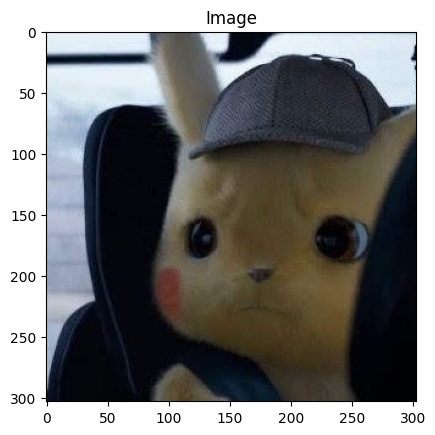

In [5]:
img = plt.imread('images/pikachu.jpg')
imshow(img, 'Image')

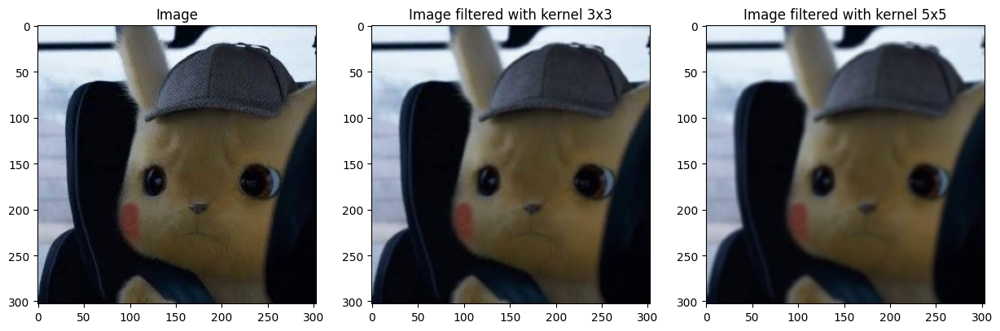

In [6]:
def blur_kernel(n):
    """Box blur kernel"""
    return np.ones((n, n)) / (n**2)

img_filtered_3 = cv2.filter2D(img, -1, blur_kernel(3))
img_filtered_5 = cv2.filter2D(img, -1, blur_kernel(5))
imshows(
    [img, img_filtered_3, img_filtered_5],
    titles=[
        'Image',
        'Image filtered with kernel 3x3', 
        'Image filtered with kernel 5x5'
    ]
)

Median filter to blur image

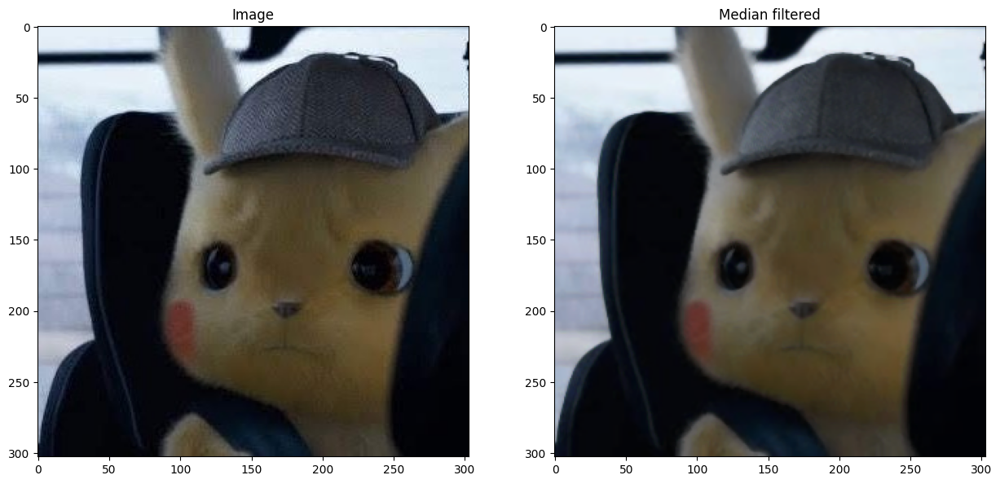

In [7]:
# Use median filter to blur image
from scipy.ndimage import median_filter
imshows([img, median_filter(img, 3)], titles=['Image', 'Median filtered'])

In [8]:
def laplacian(img):
    return cv2.Laplacian(img, cv2.CV_64F)

def var_laplacian(img):
    return cv2.Laplacian(img, cv2.CV_64F).var()

In [9]:
print("Blur Measurement of image:", var_laplacian(img))
print("Blur Measurement of gray image:", var_laplacian(gray(img)))
print("Blur Measurement of image filtered 3x3:", var_laplacian(img_filtered_3))
print("Blur Measurement of image filtered 5x5:", var_laplacian(img_filtered_5))

Blur Measurement of image: 311.2988200900928
Blur Measurement of gray image: 309.60001404483455
Blur Measurement of image filtered 3x3: 36.80372785465704
Blur Measurement of image filtered 5x5: 13.11982401665185


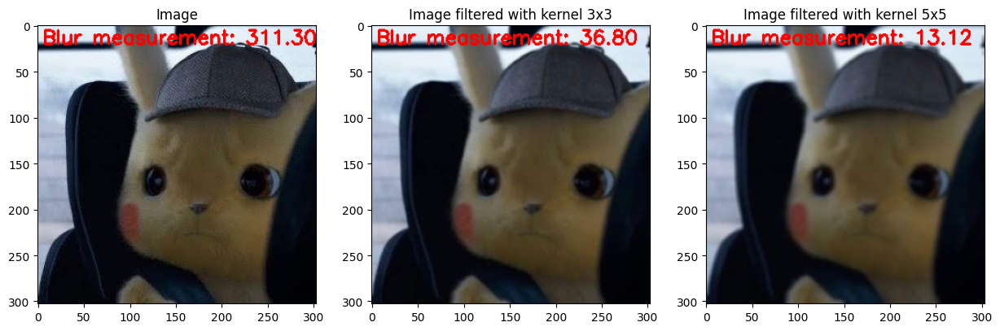

In [10]:
cv2.putText(
    img, f'Blur measurement: {var_laplacian(img):.2f}', 
    (5,20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2
)

cv2.putText(
    img_filtered_3, f'Blur measurement: {var_laplacian(img_filtered_3):.2f}', 
    (5,20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2
)

cv2.putText(
    img_filtered_5, f'Blur measurement: {var_laplacian(img_filtered_5):.2f}', 
    (5,20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2
)

imshows(
    [img, img_filtered_3, img_filtered_5],
    titles=[
        'Image',
        'Image filtered with kernel 3x3', 
        'Image filtered with kernel 5x5'
    ]
)

# Bài 2

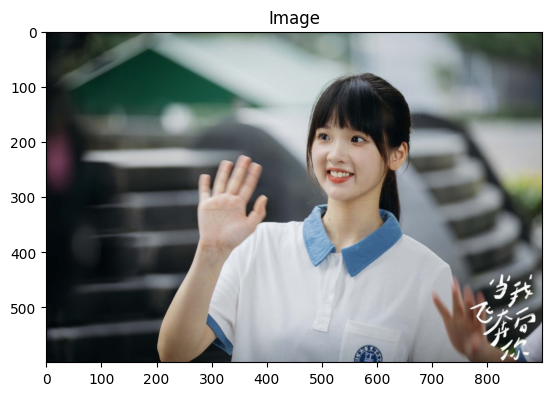

In [11]:
img = plt.imread('images/suzaizai.jpg')
imshow(img, 'Image')

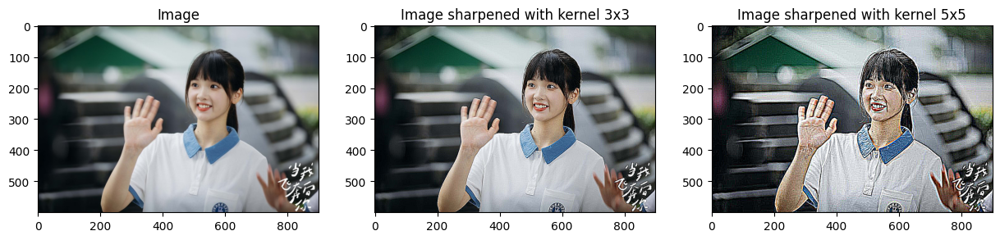

In [12]:
sharpen_kernel_3 = np.array([
    [-1,-1,-1], 
    [-1, 9,-1], 
    [-1,-1,-1]])

sharpen_kernel_5 = np.array([
    [-1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1],
    [-1, -1, 25, -1, -1],
    [-1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1]
])

img_sharpen_3 = cv2.filter2D(img, -1, sharpen_kernel_3)
img_sharpen_5 = cv2.filter2D(img, -1, sharpen_kernel_5)
imshows(
    [img, img_sharpen_3, img_sharpen_5],
    titles=[
        'Image', 
        'Image sharpened with kernel 3x3', 
        'Image sharpened with kernel 5x5'
    ]
)

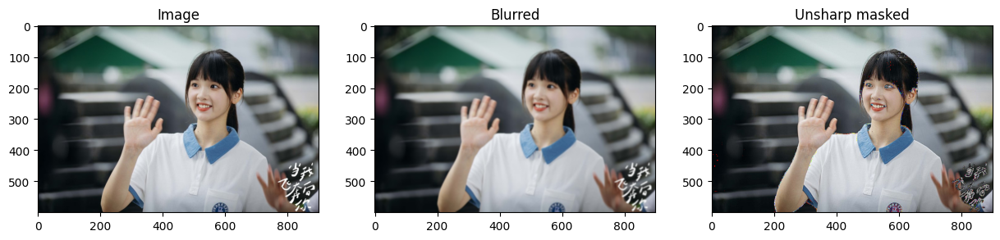

In [13]:
# Unsharp masking
img_blurred = cv2.filter2D(img, -1, blur_kernel(5))
k = 1
mask = img - img_blurred
unsharp_masked = img + k * mask
imshows(
    [img, img_blurred, unsharp_masked], 
    titles=['Image', 'Blurred', 'Unsharp masked']
)

In [14]:
print("Sharp Measurement of image:", var_laplacian(img))
print("Sharp Measurement of gray image:", var_laplacian(gray(img)))
print("Sharp Measurement of sharpen image 3x3:", var_laplacian(img_sharpen_3))
print("Sharp Measurement of sharpen image 5x5:", var_laplacian(img_sharpen_5))

Sharp Measurement of image: 239.27518655122088
Sharp Measurement of gray image: 237.4761142098765
Sharp Measurement of sharpen image 3x3: 4480.715765381203
Sharp Measurement of sharpen image 5x5: 10371.332590846456


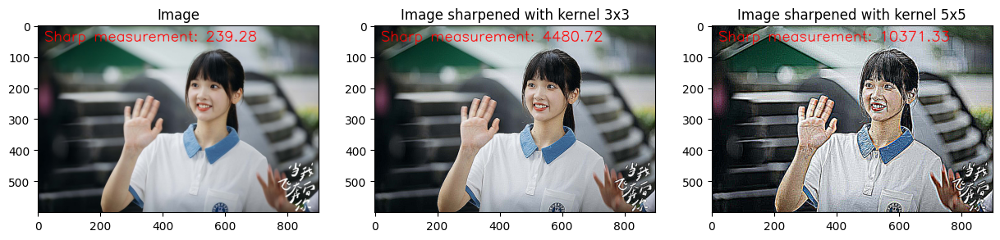

In [15]:
cv2.putText(
    img, f'Sharp measurement: {var_laplacian(img):.2f}', 
    (20,50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 2)

cv2.putText(
    img_sharpen_3, f'Sharp measurement: {var_laplacian(img_sharpen_3):.2f}', 
    (20,50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 2)

cv2.putText(
    img_sharpen_5, f'Sharp measurement: {var_laplacian(img_sharpen_5):.2f}', 
    (20,50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 2)

imshows(
    [img, img_sharpen_3, img_sharpen_5],
    titles=[
        'Image',
        'Image sharpened with kernel 3x3', 
        'Image sharpened with kernel 5x5'
    ]
)

# Bài 3

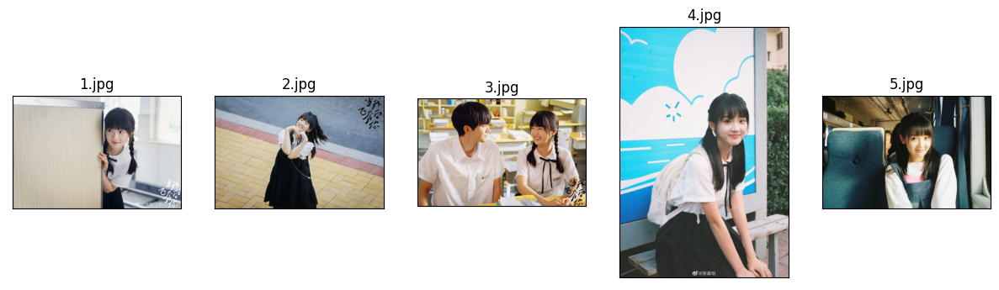

In [16]:
from pathlib import Path
folder = 'Image_Input/'

def get_imgs_from_folder(folder, get_name=False):
    files = [str(_) for _ in Path(folder).glob('*') if _.is_file()]
    # print('Image_Input folder have:', files)
    img_name = [Path(file).name for file in files]
    img_list = [plt.imread(file) for file in files]
    if get_name:
        return img_name
    return img_list

img_list = get_imgs_from_folder(folder)
img_names = get_imgs_from_folder(folder, get_name=True)
imshows(img_list, titles=img_names, clean=True)

In [17]:
# Calculate blur measurement for all images
for img, name in zip(img_list, img_names):
    print(f'Blur measurement of {name}: {var_laplacian(img)}')

Blur measurement of 1.jpg: 228.860139397517
Blur measurement of 2.jpg: 189.7710745660661
Blur measurement of 3.jpg: 350.1612322816866
Blur measurement of 4.jpg: 168.22415980732976
Blur measurement of 5.jpg: 191.5598002441194


$\Rightarrow$ Ở đây ra thấy ảnh thứ 2, 4 và 5 mờ và 2 ảnh còn lại không mờ nên ta chọn ngưỡng mờ là 200 vì ảnh 2, 4 và 5 đều có giá trị mức độ mờ **dưới 200**

In [18]:
blur_threshold = 200
result = []
for img in img_list:
    measurement = var_laplacian(img)
    if measurement < blur_threshold:
        cv2.putText(
            img, f'Blur Image: {measurement:.2f}', 
            (20,50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 2
        )
    else:
        cv2.putText(
            img, 'Good Image', 
            (20,50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 2
        )
    result.append(img)

# imshows(result, clean=True)

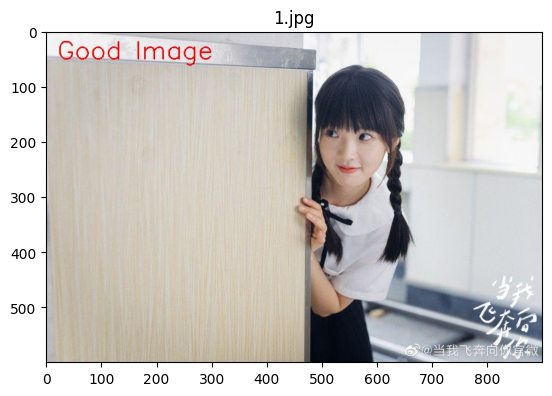

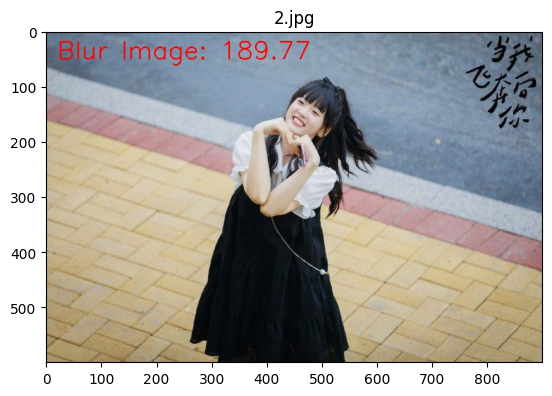

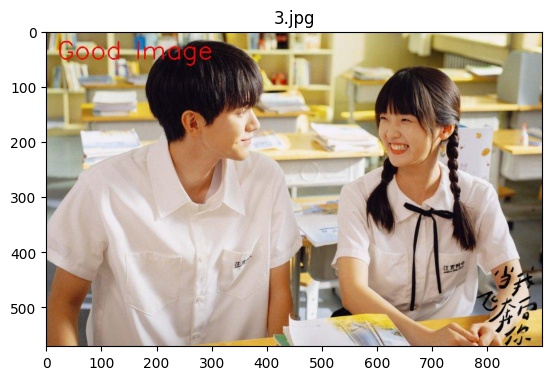

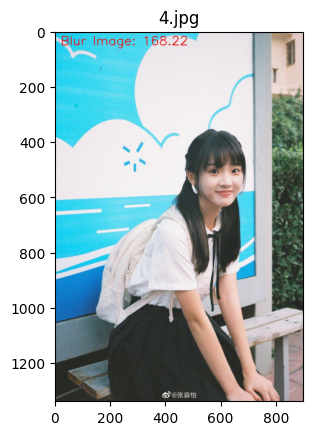

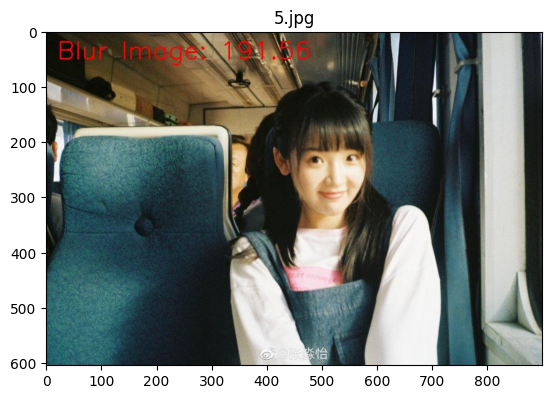

In [19]:
output_folder = Path('Image_BlurDetection_Output/')
# if not output_folder.exists():
#     output_folder.mkdir()

# Save images
from skimage.io import imsave
for img, name in zip(result, img_names):
    imsave(output_folder/name, img)

# Read all images from Image_BlurDetection_Output/ folder
output_list = get_imgs_from_folder(output_folder)
for img, name in zip(output_list, img_names):
    imshow(img, name)

# Bài 4

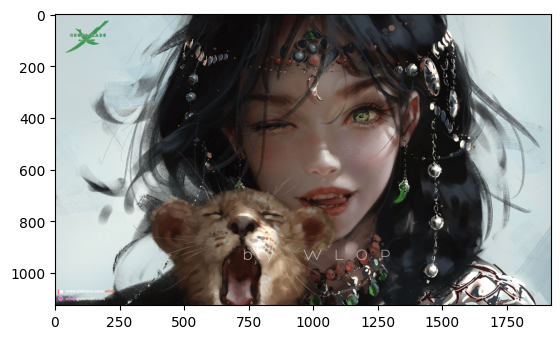

In [20]:
img = plt.imread('images/wlop.jpg')
imshow(img)

## Max RGB

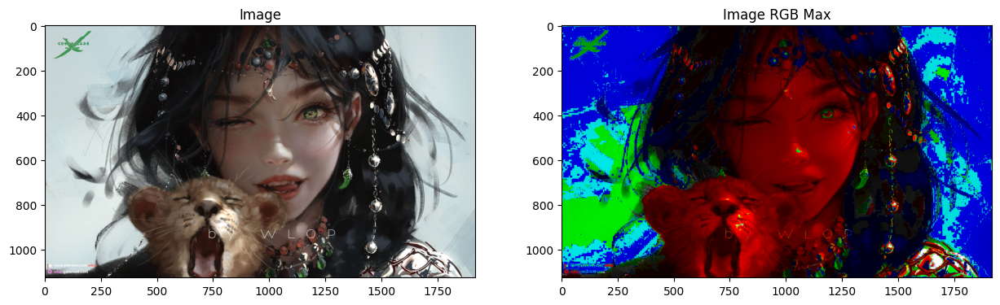

In [21]:
def max_rgb_filter(image):
    M = np.max(image, axis=2)
    R, G, B = cv2.split(image)
    R[R < M] = 0
    G[G < M] = 0
    B[B < M] = 0
    return cv2.merge([R, G, B])

img_rgbmax = max_rgb_filter(img)
imshows([img, img_rgbmax], titles=['Image', 'Image RGB Max'])

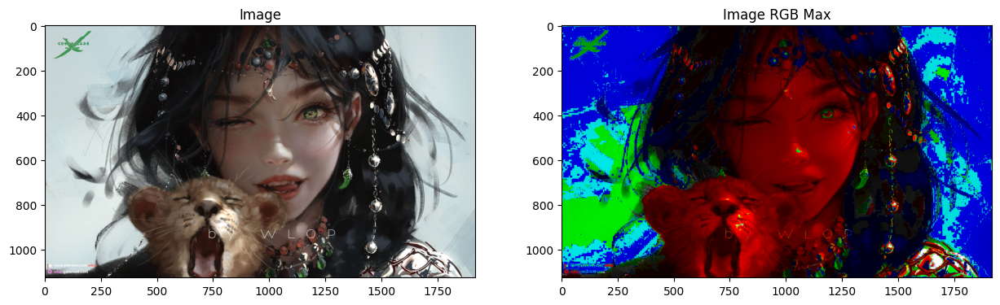

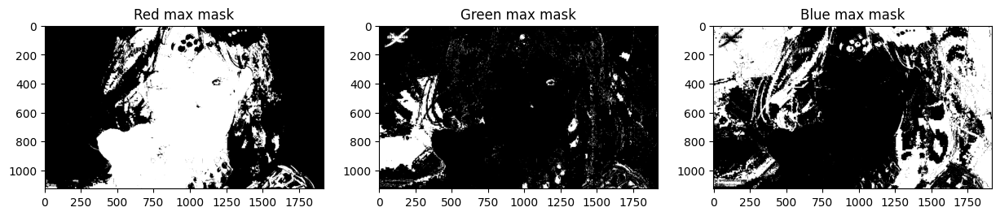

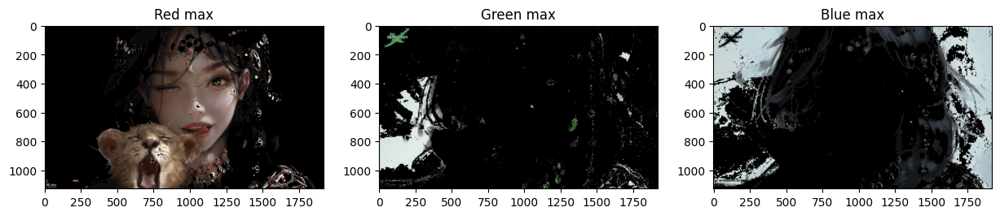

In [22]:
def get_color_by_mask(img, mask):
    """Get image color with mask"""
    return cv2.bitwise_and(img, img, mask=mask.astype(np.uint8))

img_gray = gray(img)
R, G, B = cv2.split(img_rgbmax)

max_R_mask = img_gray < 0
max_G_mask = img_gray < 0
max_B_mask = img_gray < 0
max_R_mask[(G == 0) & (B == 0)] = 1
max_G_mask[(R == 0) & (B == 0)] = 1
max_B_mask[(G == 0) & (R == 0)] = 1

img_maxR = get_color_by_mask(img, max_R_mask)
img_maxG = get_color_by_mask(img, max_G_mask)
img_maxB = get_color_by_mask(img, max_B_mask)

imshows([img, img_rgbmax], titles=['Image', 'Image RGB Max'])
imshows([max_R_mask, max_G_mask, max_B_mask],
        titles=[f'{channel} max mask' for channel in ['Red', 'Green', 'Blue']])
imshows([img_maxR, img_maxG, img_maxB], 
        titles=['Red max', 'Green max', 'Blue max'])

## Blurred/Sharpened

Blur measurement of image: 488.9457644659169


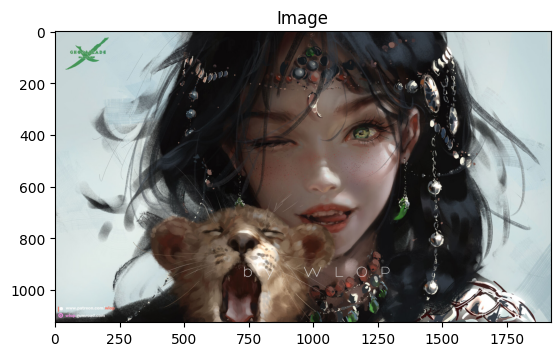

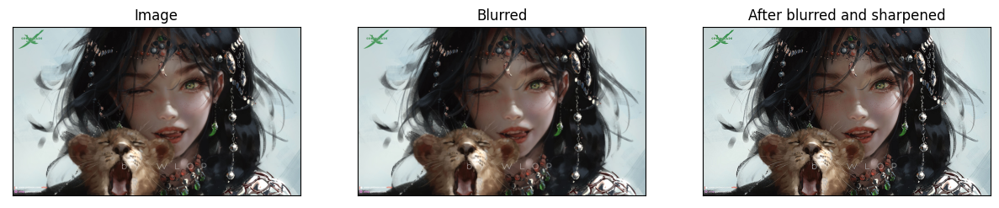

After blurred and sharpened: 1306.7112141429236


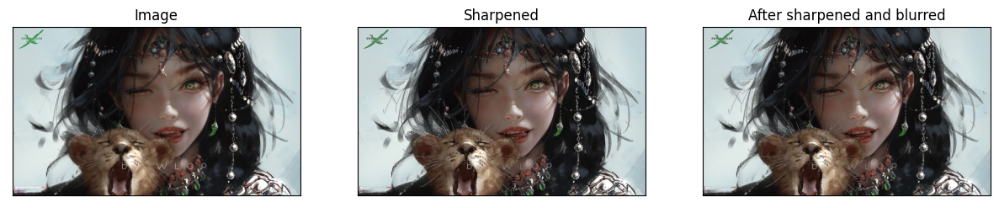

After sharpened and blurred: 454.7642703827901


In [23]:
print(f'Blur measurement of image: {var_laplacian(img)}')
imshow(img, 'Image')
# Blurring and sharpening
blurred = cv2.filter2D(img, -1, blur_kernel(3))
sharpened = cv2.filter2D(blurred, -1, sharpen_kernel_3)
imshows([img, blurred, sharpened], clean=True,
        titles=['Image', 'Blurred', 'After blurred and sharpened'])
print(f'After blurred and sharpened: {var_laplacian(sharpened)}')

# Sharpening and blurring
sharpened = cv2.filter2D(img, -1, sharpen_kernel_3)
blurred = cv2.filter2D(sharpened, -1, blur_kernel(3))
imshows([img, sharpened, blurred],  clean=True,
        titles=['Image', 'Sharpened', 'After sharpened and blurred'])
print(f'After sharpened and blurred: {var_laplacian(blurred)}')

$\Rightarrow$ Vậy độ đo mờ khi thực hiện làm mờ ảnh rồi làm rõ ảnh hay thực hiện làm rõ ảnh rồi làm mờ ảnh đều có giá trị độ đo mờ **khác ảnh gốc**. Khi làm rõ ảnh rồi làm mờ ảnh thì độ đo mờ **gần giống** với độ đo mờ của ảnh gốc.

## Edges

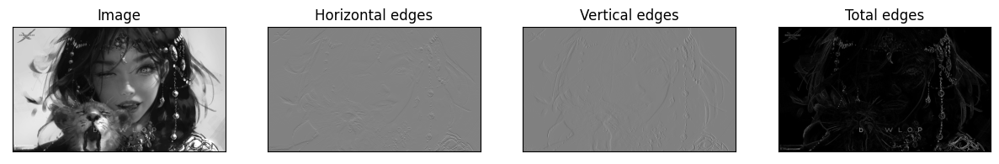

In [24]:
from skimage.filters import sobel_h, sobel_v, sobel
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# edges_horizontal = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
# edges_vertical = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
# edges_total = cv2.magnitude(edges_horizontal, edges_vertical)
sobel_horizontal = sobel_h(img_gray)
sobel_vertical = sobel_v(img_gray)
sobel_img = cv2.magnitude(sobel_horizontal, sobel_vertical)
imshows([img_gray, sobel_horizontal, sobel_vertical, sobel_img], clean=True,
        titles=['Image', 'Horizontal edges', 'Vertical edges', 'Total edges'])

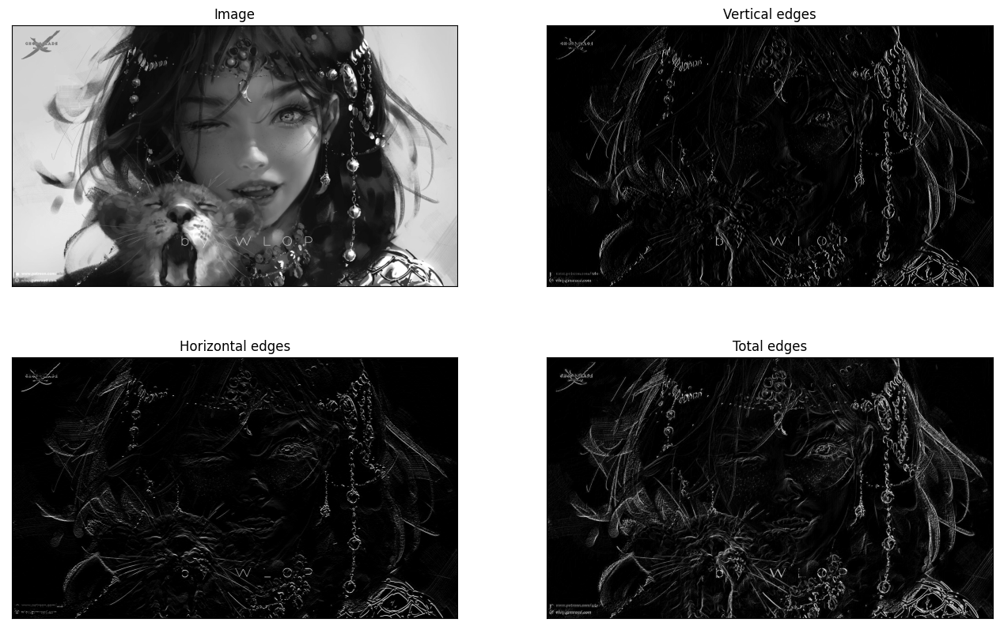

In [25]:
kernel_sobel_vertical = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]])
 
kernel_sobel_horizontal = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]])

vertical_edges = cv2.filter2D(img_gray, -1, kernel_sobel_vertical)
horizontal_edges = cv2.filter2D(img_gray, -1, kernel_sobel_horizontal)
total_edges = vertical_edges + horizontal_edges

imshows([img_gray, vertical_edges, horizontal_edges, total_edges], 
        titles=['Image', 'Vertical edges', 'Horizontal edges', 'Total edges'],
        clean=True, size=(2,2))

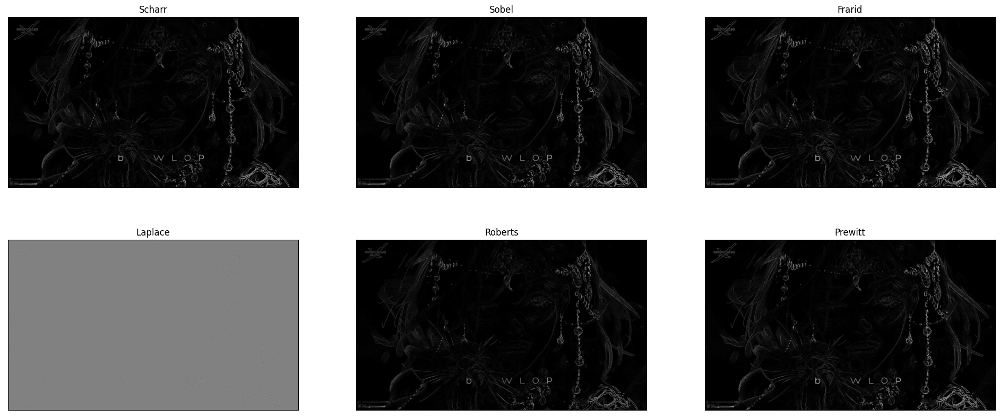

In [26]:
from skimage.filters import scharr, laplace, sobel, farid, roberts, prewitt
img_gray = gray(img)
imshows(
    [scharr(img_gray), sobel(img_gray), farid(img_gray), laplace(img_gray),
     roberts(img_gray), prewitt(img_gray)],
     titles=['Scharr', 'Sobel', 'Frarid', 'Laplace', 'Roberts', 'Prewitt'],
     size=(2, 3), clean=True)

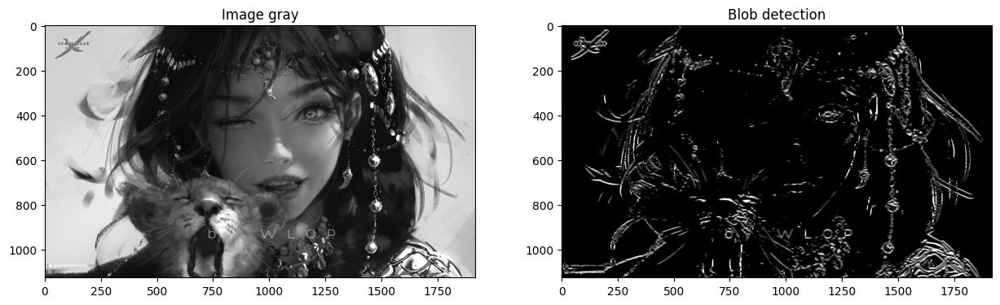

In [27]:
# Blob detection
from scipy.ndimage import gaussian_laplace
imshows([img_gray, gaussian_laplace(img_gray, sigma=3)], titles=['Image gray', 'Blob detection'])

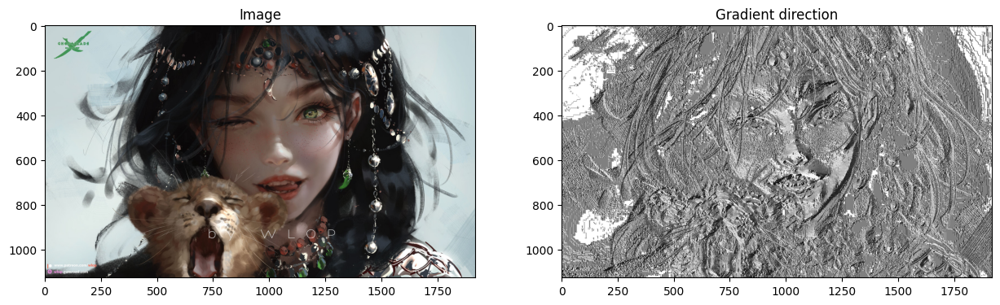

In [28]:
# Gradient direction
gradient_direction = np.arctan2(sobel_vertical, sobel_horizontal)
imshows([img, gradient_direction], titles=['Image', 'Gradient direction'])

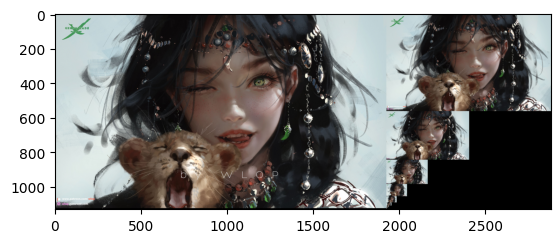

In [29]:
# Gaussian pyramid
from skimage.transform import pyramid_gaussian

rows, cols = img.shape[:2]
pyramid = tuple(pyramid_gaussian(img, downscale=2, channel_axis=-1))

composite_rows = max(rows, sum(image.shape[0] for image in pyramid[1:]))
composite_cols = cols + pyramid[1].shape[1]
composite_image = np.zeros((composite_rows, composite_cols, 3), dtype=np.double)
composite_image[:rows, :cols, :] = pyramid[0]

i_row = 0
for image in pyramid[1:]:
    n_rows, n_cols = image.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = image
    i_row += n_rows

imshow(composite_image)